In [1]:
import datetime
import pandas as pd
import matplotlib.pyplot as plt
from datlib.FRED import *
from datlib.plots import *

# all data in $ billions
data_codes  = {"Currency in Circulation": "WCURCIR",
               "GDP": "GDP",
               "Real GDP": "GDPC1"}
start = datetime.datetime(1975, 1, 1)
end = datetime.datetime.today()
data = gather_data(data_codes = data_codes, 
                   start = start, 
                   end = end, 
                   freq = "Q")

In [2]:
data

,Currency in Circulation,GDP,Real GDP
DATE,,,
1984-03-31,168.290462,3908.054,7488.167
1984-06-30,172.464308,4009.601,7617.547
1984-09-30,176.321385,4084.250,7690.985
1984-12-31,178.572923,4148.551,7754.117
1985-03-31,179.415308,4230.168,7829.260
...,...,...,...
2021-03-31,2103.954692,22038.226,19055.655
2021-06-30,2168.094538,22740.959,19368.310
2021-09-30,2189.947538,23202.344,19478.893


In [3]:
# V = Py / M
data["Velocity"] = data["GDP"].div(data["Currency in Circulation"])
# k = 1 / v
data["Portfolio Demand"] = data["Velocity"].pow(-1)
# P = Py / y
data["GDP Deflator"] = data["GDP"].div(data["Real GDP"])

In [4]:
data

,Currency in Circulation,GDP,Real GDP,Velocity,Portfolio Demand,GDP Deflator
DATE,,,,,,
1984-03-31,168.290462,3908.054,7488.167,23.222077,0.043062,0.521897
1984-06-30,172.464308,4009.601,7617.547,23.248874,0.043013,0.526364
1984-09-30,176.321385,4084.250,7690.985,23.163668,0.043171,0.531044
1984-12-31,178.572923,4148.551,7754.117,23.231691,0.043045,0.535013
1985-03-31,179.415308,4230.168,7829.260,23.577520,0.042413,0.540302
...,...,...,...,...,...,...
2021-03-31,2103.954692,22038.226,19055.655,10.474668,0.095468,1.156519
2021-06-30,2168.094538,22740.959,19368.310,10.488915,0.095339,1.174132
2021-09-30,2189.947538,23202.344,19478.893,10.594931,0.094385,1.191153


C:\Users\JLCat\GithubRepositories\Macroeconomics-Growth-and-Monetary-Equilibrium\Data Homework Assignments\datlib\plots.py:21: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_yticklabels([round(x,2) for x in vals])


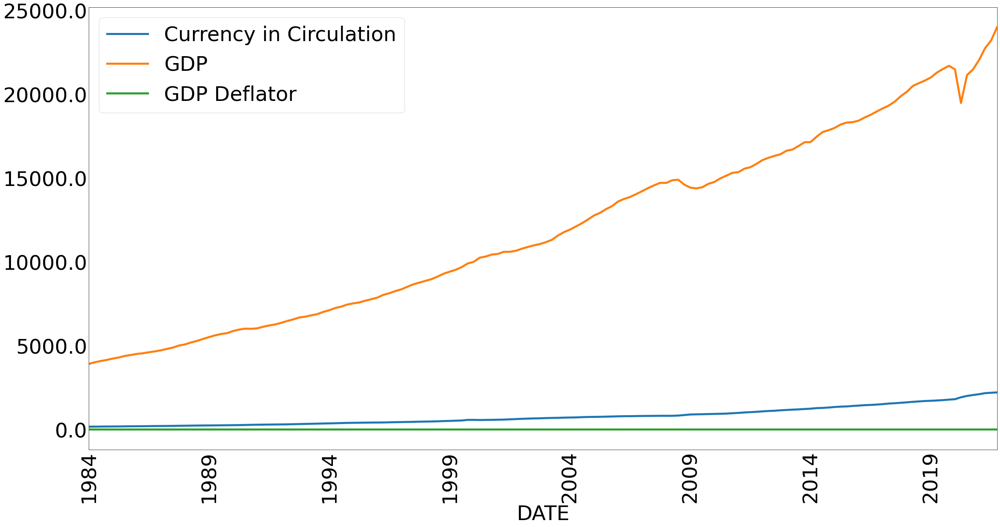

In [5]:
plt.rcParams.update({"font.size":50})
plot_vars= ["Currency in Circulation", "GDP", "GDP Deflator"]
plot_data = data[plot_vars]
plot_lines(plot_data, linewidth = 5)#, secondary_y = "Currency in Circulation")

In [6]:
import numpy as np
log_data = np.log(data)

In [7]:
log_data

,Currency in Circulation,GDP,Real GDP,Velocity,Portfolio Demand,GDP Deflator
DATE,,,,,,
1984-03-31,5.125691,8.270795,8.921079,3.145103,-3.145103,-0.650284
1984-06-30,5.150190,8.296447,8.938210,3.146257,-3.146257,-0.641763
1984-09-30,5.172308,8.314893,8.947804,3.142585,-3.142585,-0.632911
1984-12-31,5.184997,8.330514,8.955979,3.145517,-3.145517,-0.625465
1985-03-31,5.189703,8.349997,8.965623,3.160294,-3.160294,-0.615626
...,...,...,...,...,...,...
2021-03-31,7.651574,10.000534,9.855119,2.348960,-2.348960,0.145415
2021-06-30,7.681604,10.031923,9.871394,2.350319,-2.350319,0.160529
2021-09-30,7.691633,10.052009,9.877087,2.360376,-2.360376,0.174922


C:\Users\JLCat\GithubRepositories\Macroeconomics-Growth-and-Monetary-Equilibrium\Data Homework Assignments\datlib\plots.py:21: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_yticklabels([round(x,2) for x in vals])


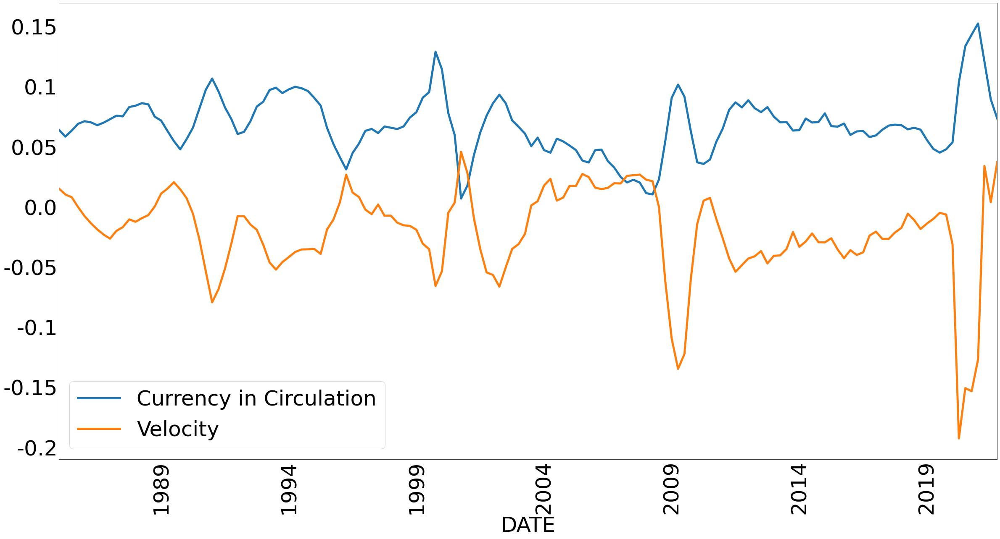

In [22]:
plot_vars= ["Currency in Circulation", "Velocity"]
plot_data = log_data[plot_vars].diff(4)
plot_lines(plot_data, linewidth = 5)

C:\Users\JLCat\GithubRepositories\Macroeconomics-Growth-and-Monetary-Equilibrium\Data Homework Assignments\datlib\plots.py:21: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_yticklabels([round(x,2) for x in vals])


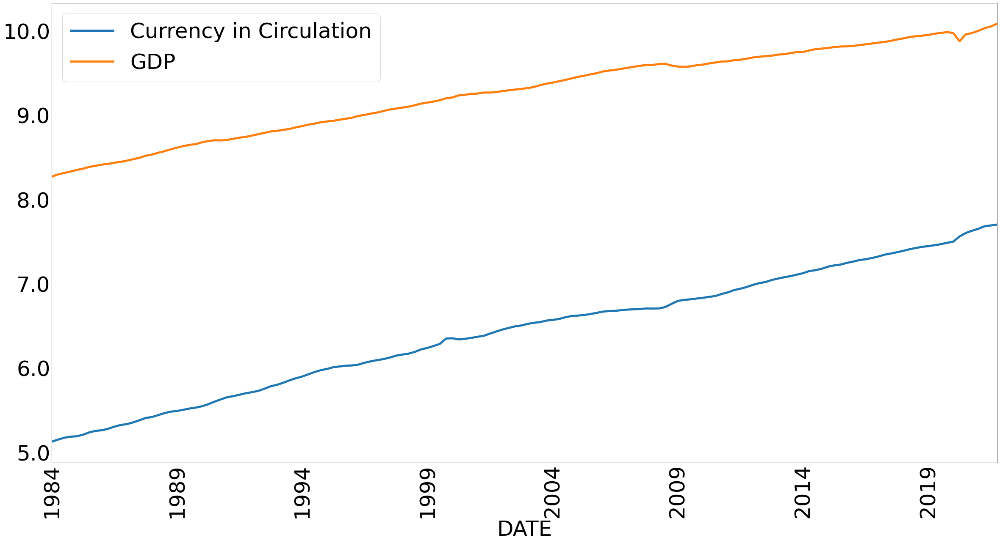

In [9]:
plot_vars= ["Currency in Circulation", "GDP"]
plot_data = log_data[plot_vars]
plot_lines(plot_data, linewidth = 5)#, secondary_y = "GDP")

C:\Users\JLCat\GithubRepositories\Macroeconomics-Growth-and-Monetary-Equilibrium\Data Homework Assignments\datlib\plots.py:21: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_yticklabels([round(x,2) for x in vals])


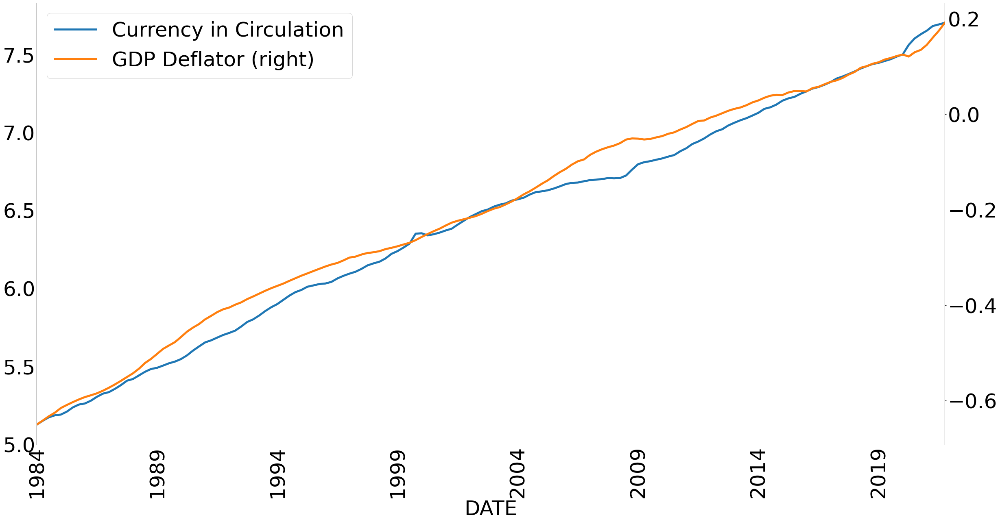

In [10]:
plot_vars= ["Currency in Circulation", "GDP Deflator"]
plot_data = log_data[plot_vars]
plot_lines(plot_data, linewidth = 5, secondary_y = "GDP Deflator")

In [11]:
# 4 quarters in one year
# create a year-over-year difference using 4 quarters
diff_length = 4
log_diff_data = log_data.diff(diff_length)

In [12]:
log_diff_data

,Currency in Circulation,GDP,Real GDP,Velocity,Portfolio Demand,GDP Deflator
DATE,,,,,,
1984-03-31,NaN,NaN,NaN,NaN,NaN,NaN
1984-06-30,NaN,NaN,NaN,NaN,NaN,NaN
1984-09-30,NaN,NaN,NaN,NaN,NaN,NaN
1984-12-31,NaN,NaN,NaN,NaN,NaN,NaN
1985-03-31,0.064012,0.079202,0.044544,0.015190,-0.015190,0.034658
...,...,...,...,...,...,...
2021-03-31,0.152485,0.025593,0.005455,-0.126892,0.126892,0.020138
2021-06-30,0.120831,0.154911,0.115351,0.034080,-0.034080,0.039560
2021-09-30,0.089279,0.093154,0.048281,0.003875,-0.003875,0.044873


C:\Users\JLCat\GithubRepositories\Macroeconomics-Growth-and-Monetary-Equilibrium\Data Homework Assignments\datlib\plots.py:21: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_yticklabels([round(x,2) for x in vals])


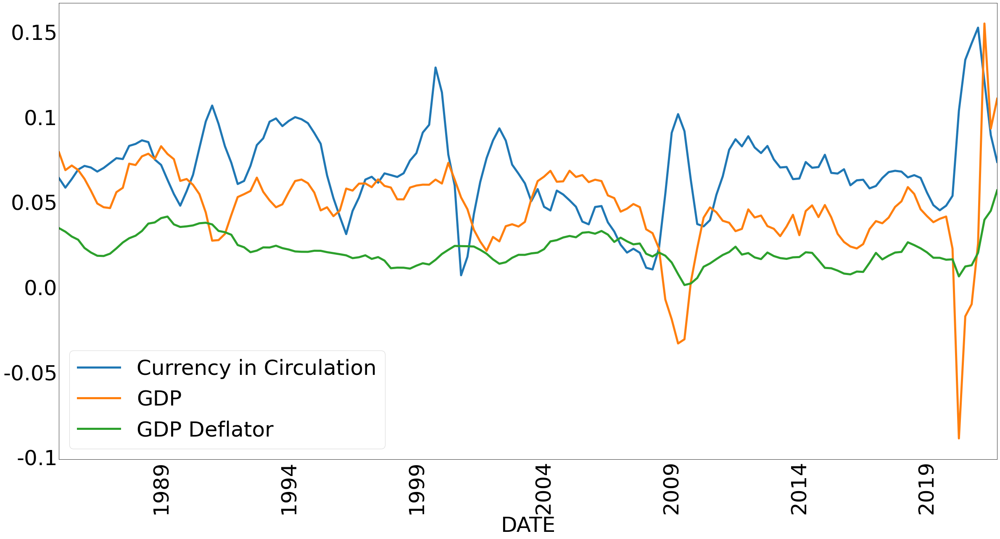

In [13]:
plot_vars= ["Currency in Circulation", "GDP", "GDP Deflator"]
plot_data = log_diff_data[plot_vars]
plot_lines(plot_data, linewidth = 5)

C:\Users\JLCat\GithubRepositories\Macroeconomics-Growth-and-Monetary-Equilibrium\Data Homework Assignments\datlib\plots.py:21: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_yticklabels([round(x,2) for x in vals])


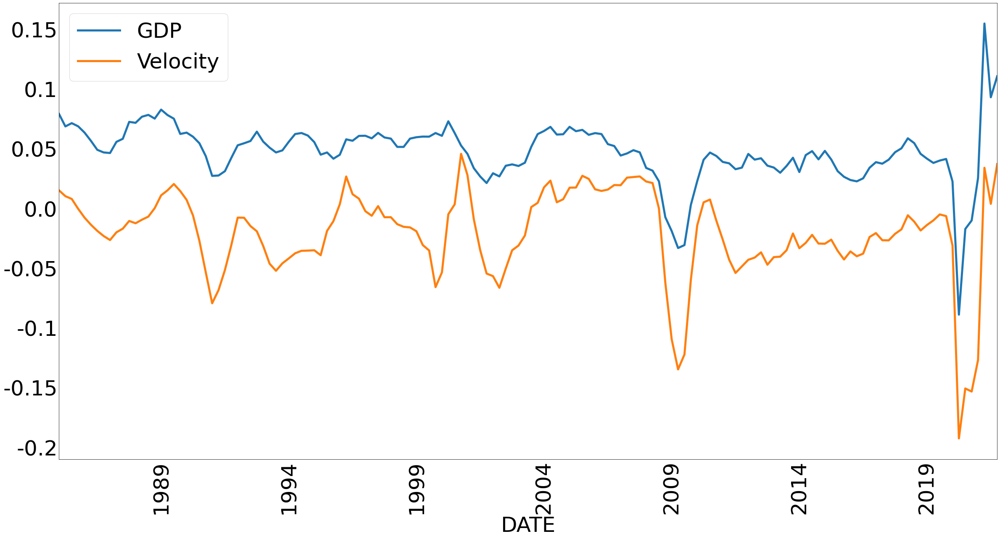

In [14]:
plot_vars= [ "GDP", "Velocity"]#, "Currency in Circulation", "GDP Deflator"]
plot_data = log_diff_data[plot_vars]
plot_lines(plot_data, linewidth = 5)

C:\Users\JLCat\GithubRepositories\Macroeconomics-Growth-and-Monetary-Equilibrium\Data Homework Assignments\datlib\plots.py:45: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize = figsize)


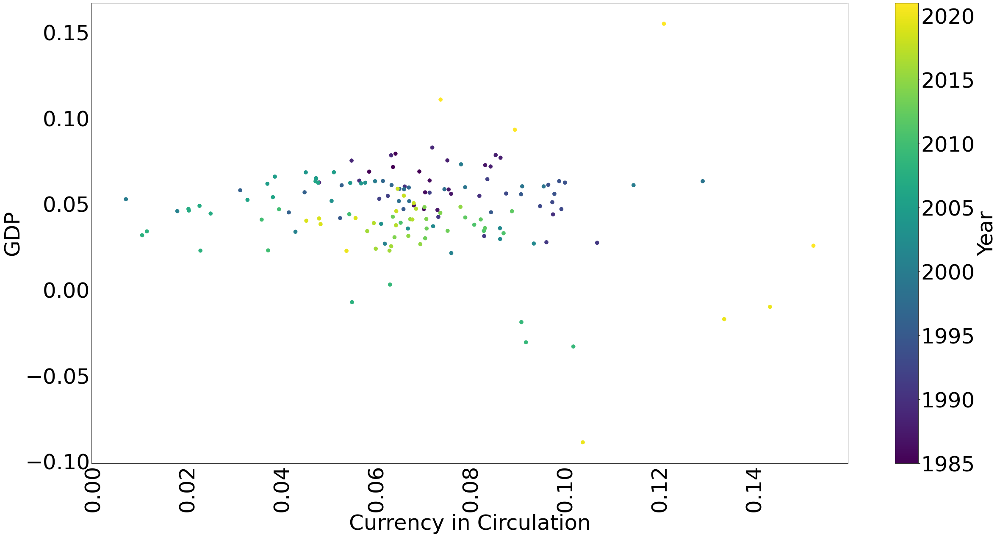

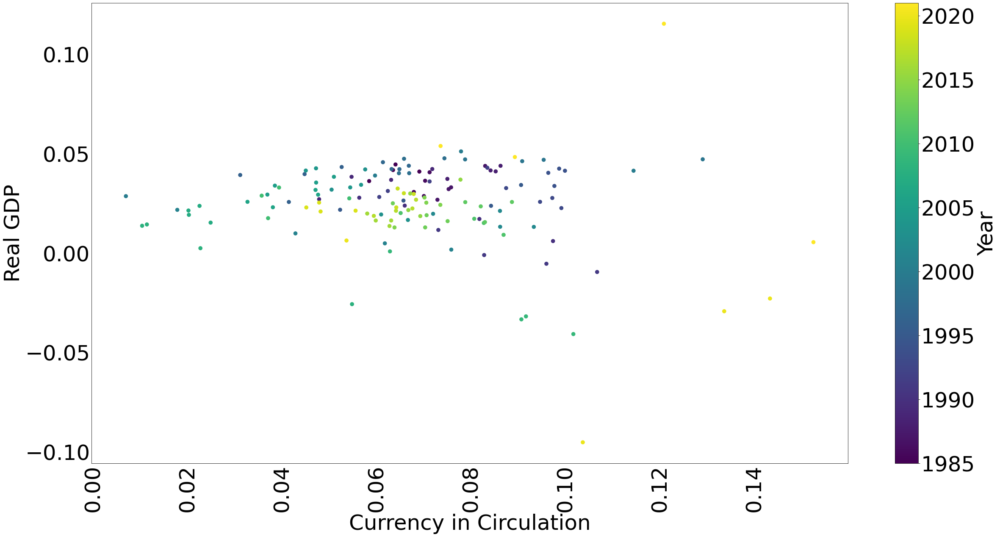

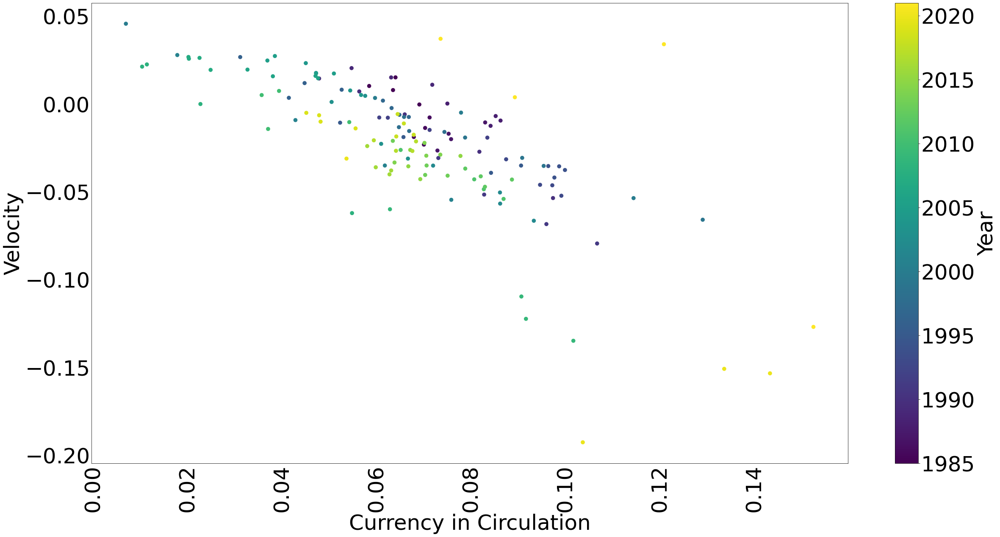

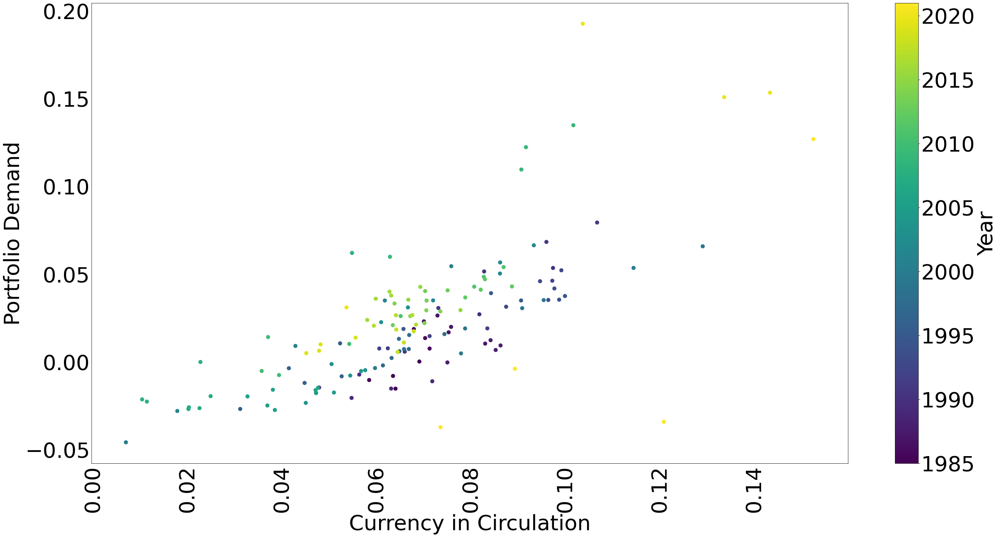

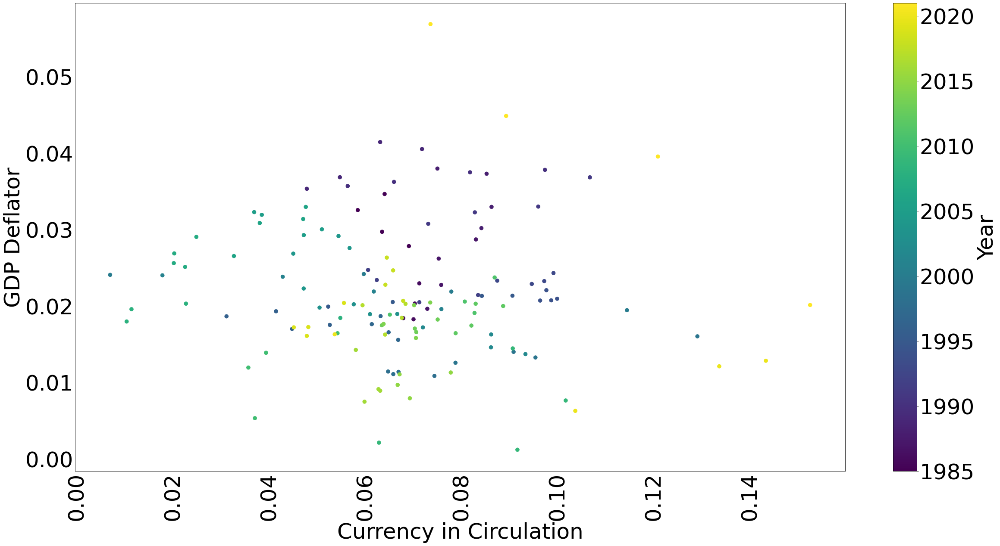

...

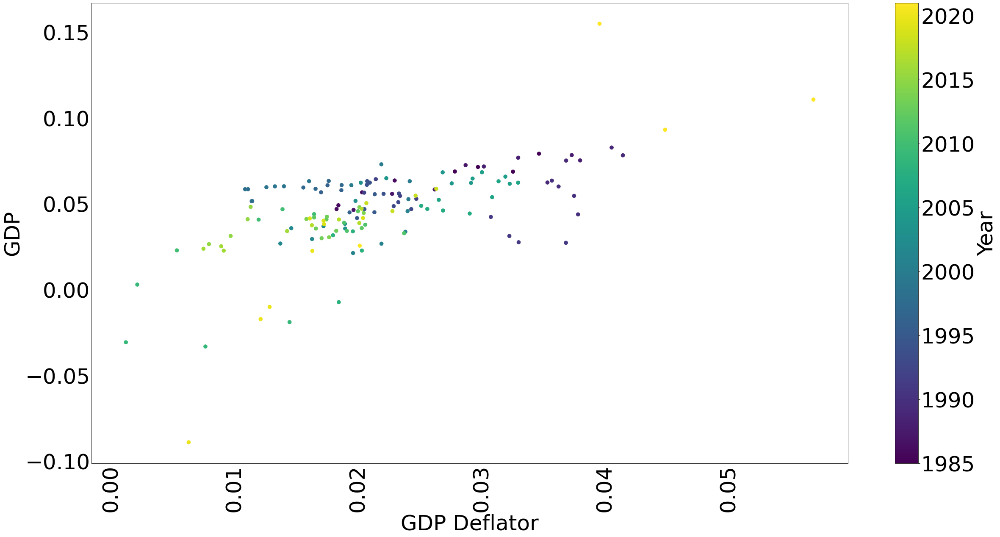

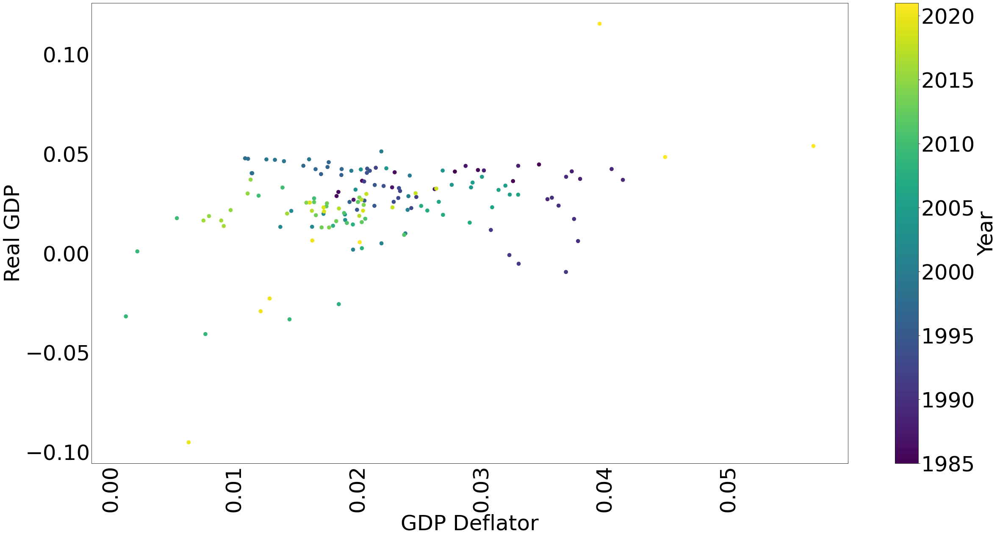

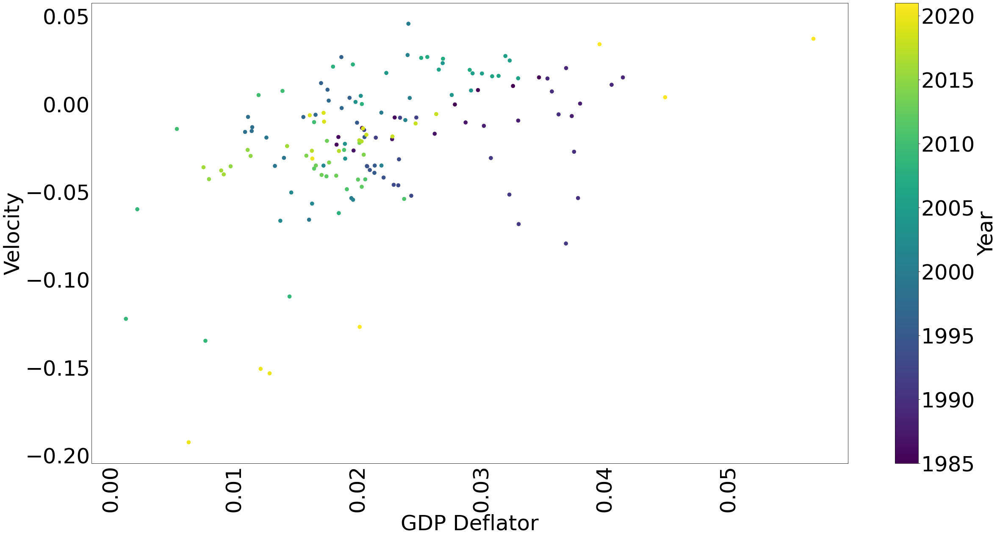

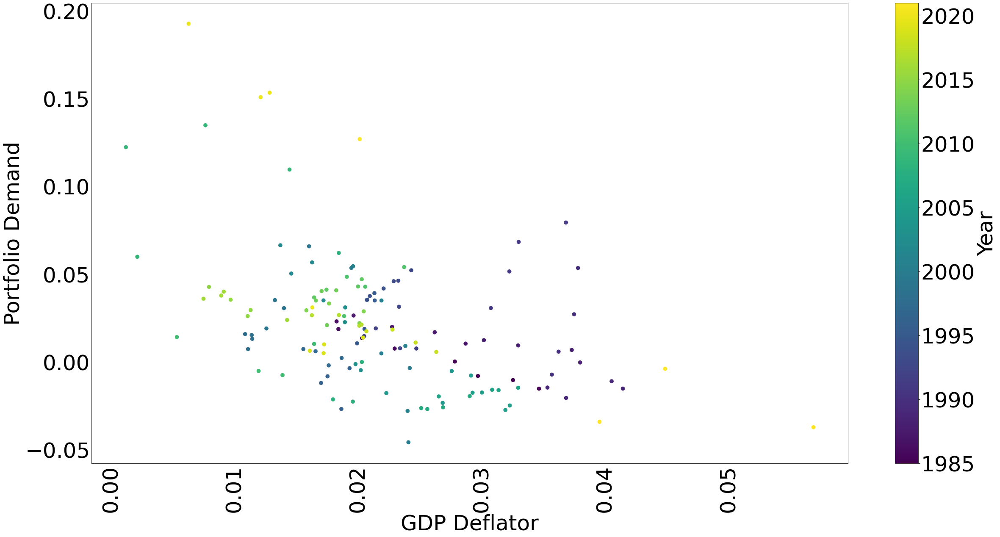

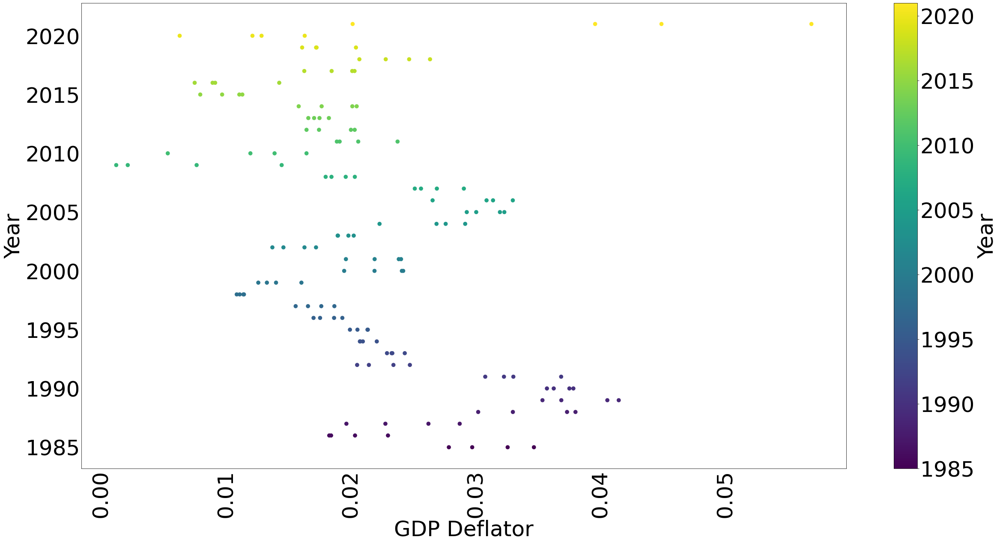

In [15]:
plot_scatter(log_diff_data)

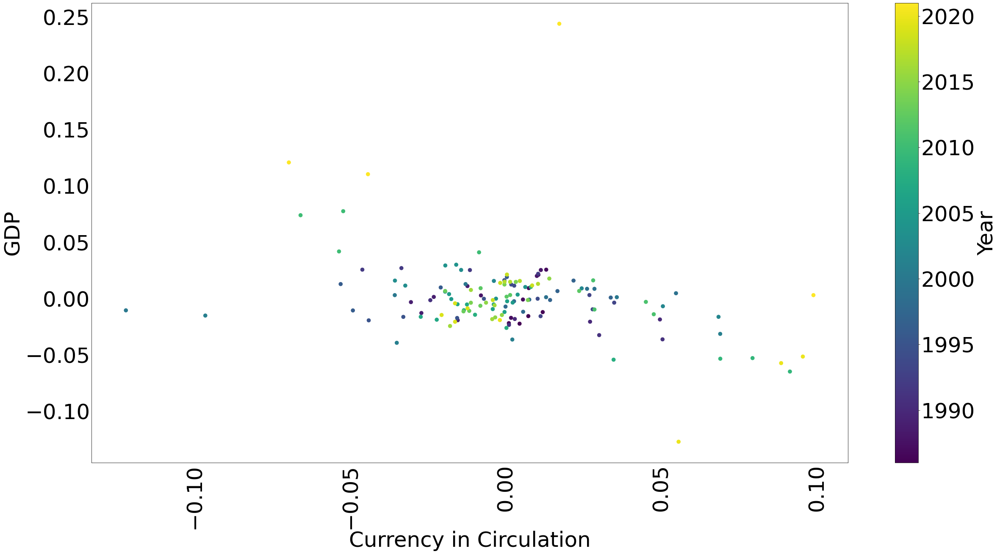

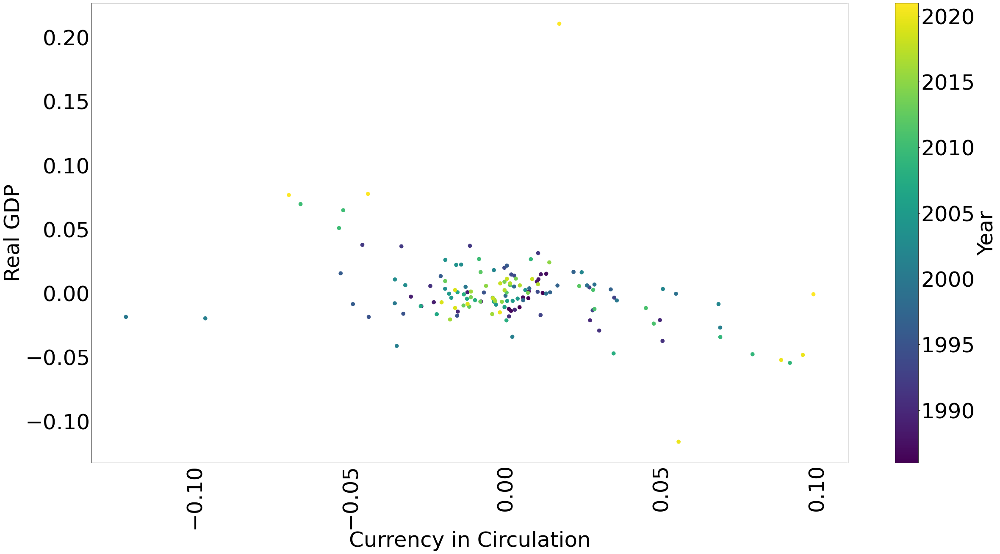

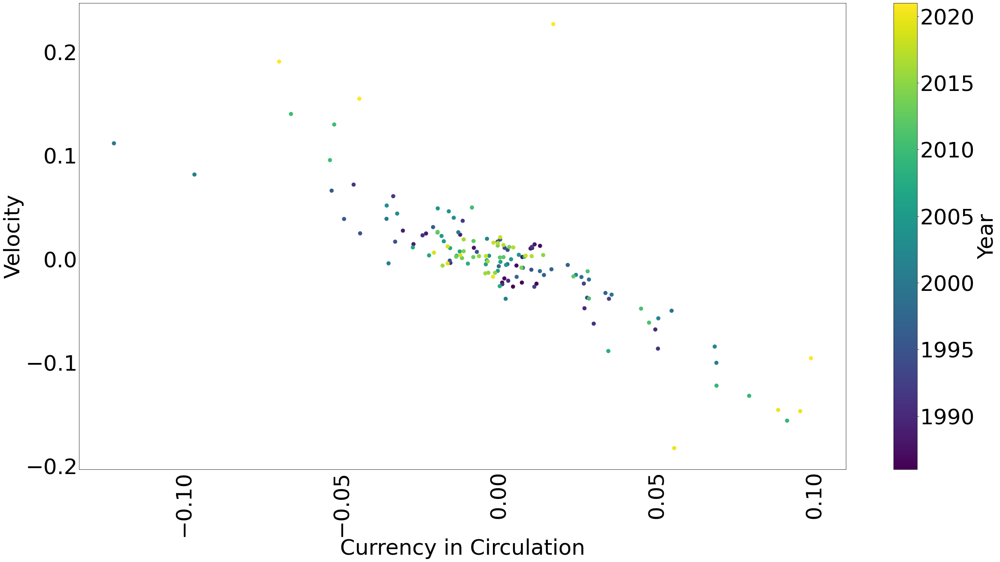

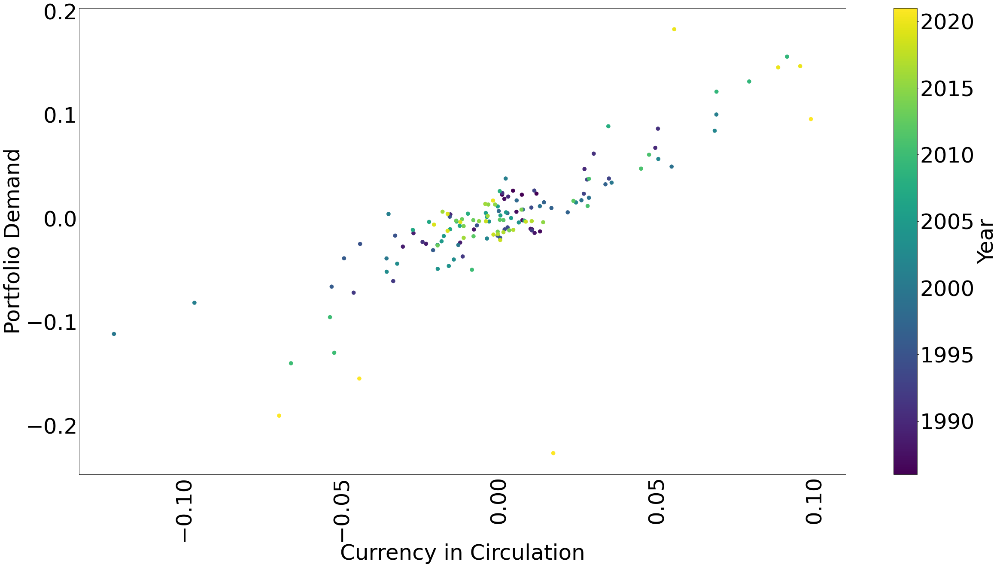

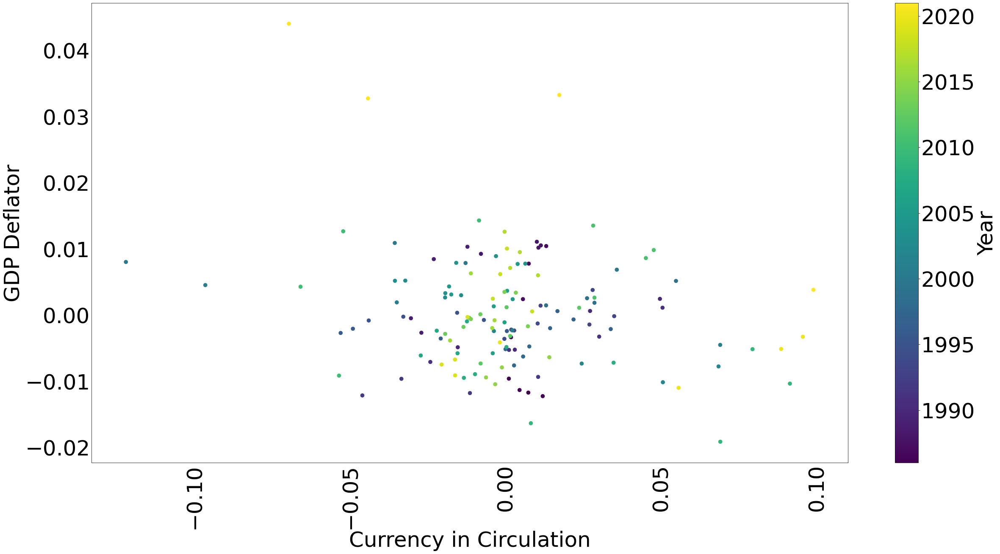

...

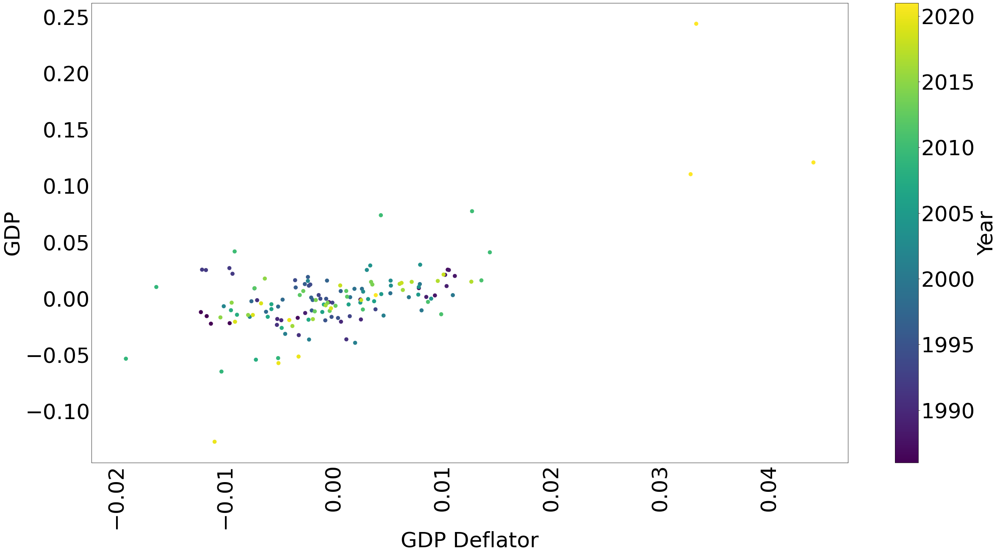

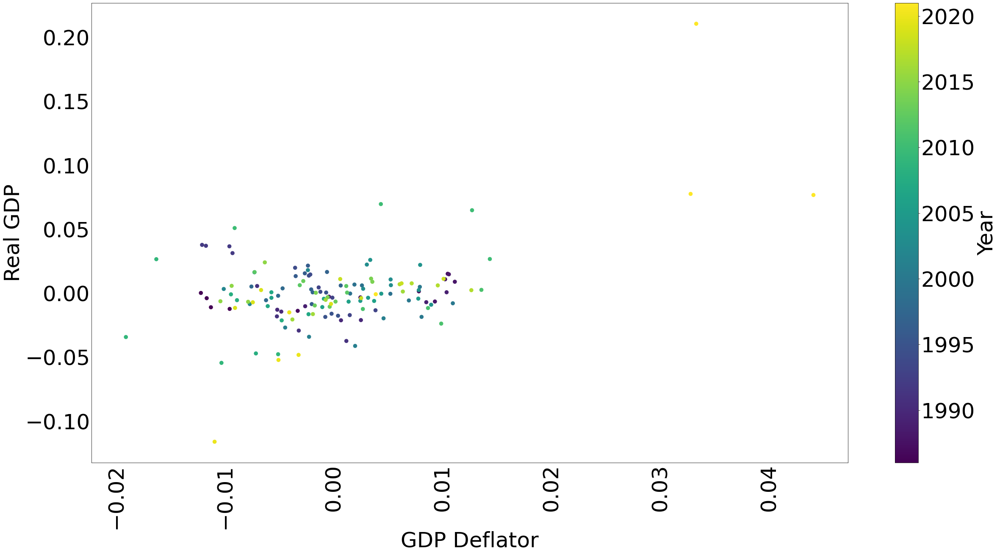

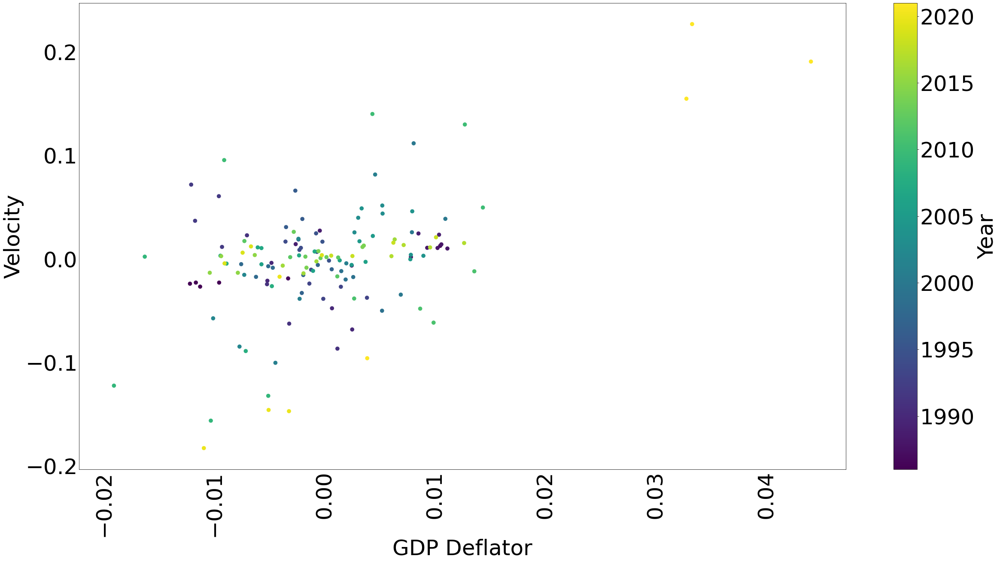

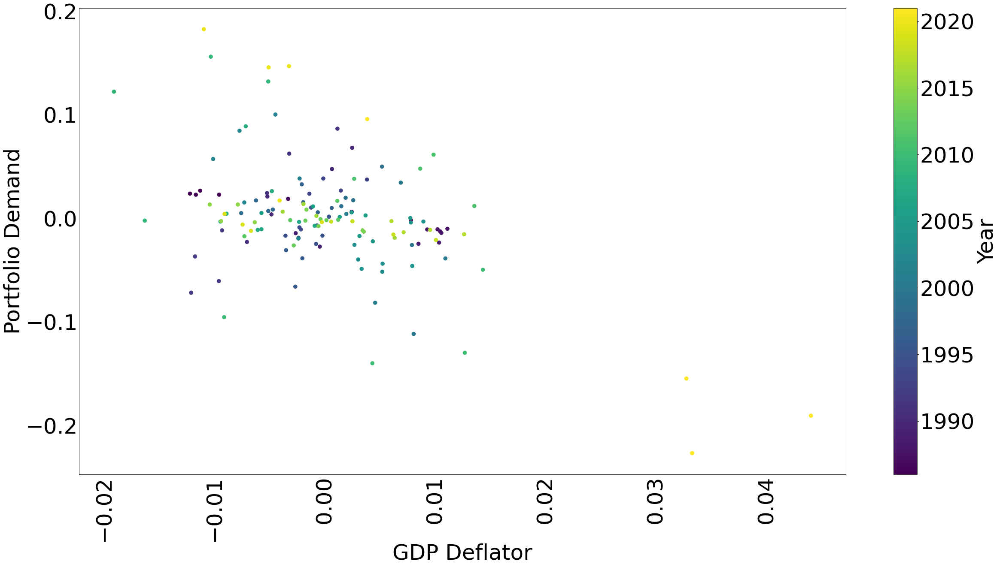

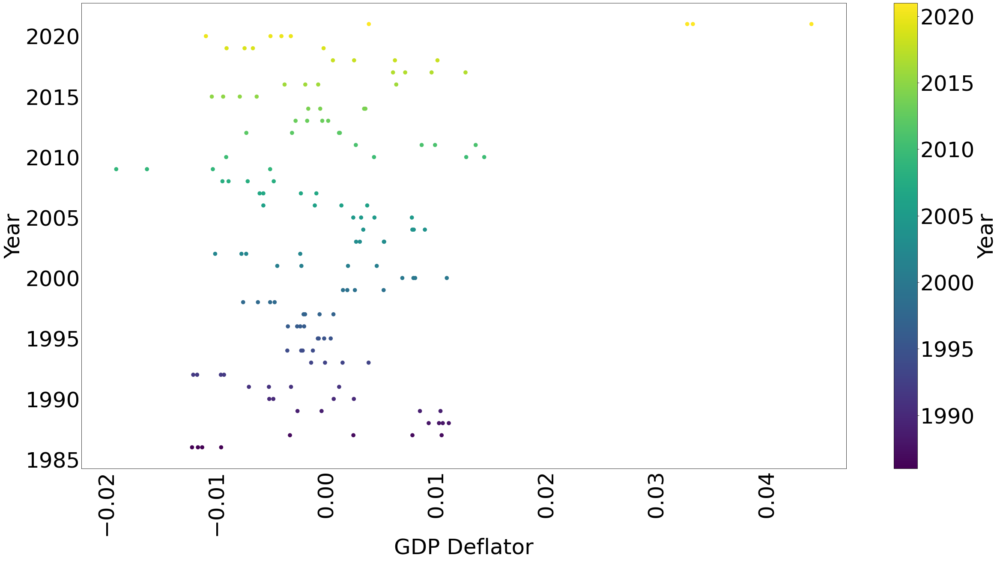

In [16]:
plot_scatter(log_diff_data.diff(4))